# Final MRI analyses

This notebooks contains the code to create all of the brain data figures and tables in the manuscript. 

It conducts second-level GLM and non-parametric clustering analysis, then visualizes the results. 

# Imports

In [1]:
import os
import csv
import json
import numpy as np
import pandas as pd
import nibabel as nib
import nilearn as nl

from nilearn import image
from nilearn import plotting
from nilearn.interfaces import fmriprep
from nilearn.image import load_img
from nilearn.signal import clean
from nilearn.image import resample_img
from nilearn.masking import compute_brain_mask
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm.second_level import non_parametric_inference
import nilearn.plotting as plotting

import matplotlib.pyplot as plt
from nilearn.plotting import plot_glass_brain
from scipy.stats import norm

from nilearn import datasets
import numpy as np
from nilearn.reporting import get_clusters_table

from scipy.stats import norm
from nilearn.glm import cluster_level_inference

import numpy as np
import nibabel as nib
import scipy.ndimage
from nilearn import plotting, masking
import matplotlib.pyplot as plt
import itertools
from nilearn.datasets import load_mni152_template
import pickle 
import nilearn.surface as surface

import scipy.ndimage
from nilearn import plotting, masking, datasets, image
import matplotlib

import scipy
from scipy.ndimage import label, generate_binary_structure
import numpy as np
import pandas as pd  # Import pandas for DataFrame


!pip install great_tables

# Conduct Second-level GLM & Clustering

Skip this cell if you've already run the analysis and saved out the result

In [ ]:
contrast_path = '../first_level_GLM/' 

contrast_list = [
                     'labeled-judge-videos_two---one',
                     'labeled-type-videos_veridical---scrambled' , 
                ]


group_contrasts = {
                      'labeled-judge-videos_two---one':[],
                      'labeled-type-videos_veridical---scrambled' :[],
                  }

group_clusters = group_contrasts


for c in contrast_list:

    print(c + '~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

    # Load contrast maps (adjust file names accordingly)
    contrast_files = [ contrast_path + '/' + x for x in os.listdir(contrast_path) if c in x and 'eff-size.nii.gz' in x and "COMB" not in x ]

    # Create a minimal design matrix for the intercept
    design_matrix = pd.DataFrame(
    [1] * len(contrast_files),
    columns=["intercept"],)

    # Fit the second-level model
    print('making and fitting second level model')
    second_level_model = SecondLevelModel()
    second_level_model.fit(contrast_files, design_matrix=design_matrix)

    print('computing cluster data')
    # Compute cluster data
    group_cluster = non_parametric_inference(contrast_files,
                                            design_matrix=design_matrix,
                                            model_intercept=True, 
                                            n_perm=10000,  
                                            two_sided_test=True, 
                                            n_jobs=12, 
                                            threshold = 0.001,  
                                            random_state=1

)
    print('appending to cluster dict')
    group_clusters[c].append(group_cluster)

    print('computing group-level contrast')
    # Compute the group-level contrast
    group_contrast = second_level_model.compute_contrast([1], output_type='all')

    group_contrasts[c].append(group_contrast)

    print(c + ' complete ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~`')


# save the results
with open('group_contrasts_RAND_STATE_1.pkl', 'wb') as file:
    pickle.dump(group_contrasts, file)

with open('group_clusters_RAND_STATE_1.pkl', 'wb') as file:
    pickle.dump(group_clusters, file)


# If you have already run the analyses, re-load the data below

In [2]:
# with open("group_contrasts_RAND_STATE_1.pkl", 'rb') as file:
#     group_contrasts = pickle.load(file)
    
# with open("group_clusters_RAND_STATE_1.pkl", 'rb') as file:
#     group_clusters  = pickle.load(file)

# Function for determing appropriate cluster result threshold to use

In [3]:
import math

def convert_log10_pvalue(negative_log10_pvalue):
  """
  Converts a negative log10 p-value back to the original p-value.

  Args:
      negative_log10_pvalue: The negative log10 p-value to convert.

  Returns:
      The original p-value.
  """
  return 10 ** (-negative_log10_pvalue)


# Select the appropriate cluster threshold

In [4]:
negative_log10_pvalue = 1.3
p_value = convert_log10_pvalue(negative_log10_pvalue)
print("Threshold of "+str(negative_log10_pvalue)+" corresponds to original p-value:", p_value)

Threshold of 1.3 corresponds to original p-value: 0.05011872336272722


# Visualize contrast activity: Judged Fake versus Judged Real

In [5]:
cluster_label = 'labeled-judge-videos_two---one'

# binarize the cluster map for this contrast
mask_of_interest = group_clusters[cluster_label][0]['logp_max_size']
np.unique((mask_of_interest.get_fdata()))
bin_mask = np.where(mask_of_interest.get_fdata()>1.3, 1, 0)
bin_mask_of_interest = nib.Nifti1Image(bin_mask, affine = mask_of_interest.affine, header=mask_of_interest.header)

# get the corresponding contrast data
orig = group_contrasts[cluster_label][1]['stat']
masked_stat = nl.masking.apply_mask(orig, bin_mask_of_interest)
plot_data = nib.Nifti1Image(masked_stat, orig.affine, orig.header)

# apply the cluster mask to the contrast data
mask_array = bin_mask_of_interest.get_fdata()
data_array = orig.get_fdata()
new_data = np.multiply(mask_array, data_array)
plot_this = nib.Nifti1Image(new_data, orig.affine, orig.header)

# set threshold (in absolute value) & check it's lower than lowest t-value
threshold = .00000000000000000000000001
print(np.min(np.abs(new_data[new_data!=0])) > threshold)

# plot the resulting contrast data bounded by the cluster regions
plotting.view_img_on_surf(plot_this, threshold=threshold, darkness=.25,)

True


Uncomment below to see the full brain data before cluster thresholding

In [6]:
# cluster_label = 'labeled-judge-videos_two---one'

# # get the corresponding contrast data
# orig = group_contrasts[cluster_label][1]['stat']

# # plot the resulting contrast data bounded by the cluster regions
# plotting.view_img_on_surf(orig,  darkness=.25)

# Look at contrast activity: Scrambled versus Veridical

First, make an easy interactive visualization

In [7]:
cluster_label = 'labeled-type-videos_veridical---scrambled'

# binarize the cluster map for this contrast
mask_of_interest = group_clusters[cluster_label][0]['logp_max_size']
np.unique((mask_of_interest.get_fdata()))
bin_mask = np.where(mask_of_interest.get_fdata()>1.3, 1, 0) # here we use our threshold of 1.3
bin_mask_of_interest = nib.Nifti1Image(bin_mask, affine = mask_of_interest.affine, header=mask_of_interest.header)

# get the corresponding contrast data
orig = group_contrasts[cluster_label][1]['stat']
masked_stat = nl.masking.apply_mask(orig, bin_mask_of_interest)
plot_data = nib.Nifti1Image(masked_stat, orig.affine, orig.header)

# apply the cluster mask to the contrast data
mask_array = bin_mask_of_interest.get_fdata()
data_array = orig.get_fdata()
new_data = np.multiply(mask_array, data_array)*-1 # mulitply by -1 since we'd like to see scrambled - veridical
plot_this = nib.Nifti1Image(new_data, orig.affine, orig.header)

# set threshold (in absolute value) & check it's lower than lowest t-value
threshold = .00000000000000000000000001
print(np.min(np.abs(new_data[new_data!=0])) > threshold)

# plot the resulting contrast data bounded by the cluster regions
plotting.view_img_on_surf(plot_this, threshold=threshold, darkness=.25)

True


Uncomment below to see the full brain data before cluster thresholding

In [9]:
# cluster_label = 'labeled-type-videos_veridical---scrambled'

# # get the corresponding contrast data
# orig = group_contrasts[cluster_label][1]['stat']

# # apply the cluster mask to the contrast data
# data_array = orig.get_fdata()*-1 # multiply by -1 to reverse the contrast
# plot_this = nib.Nifti1Image(data_array, orig.affine, orig.header)

# # plot the resulting contrast data bounded by the cluster regions
# plotting.view_img_on_surf(plot_this,  darkness=.25)

# Explore Cluster Details: Judged Fake versus Judged Real

Visualize each individual cluster.

Get the most strongly activated voxel in each cluster (the t-value and the voxel location).

Also, check the range of t-values in each cluster

Number of connected voxel clusters: 13

Cluster 1: Voxel value range: -5.2635716126114085 to -3.835254326657878

Most significant voxel in cluster 1: [-50. -71.  13.]


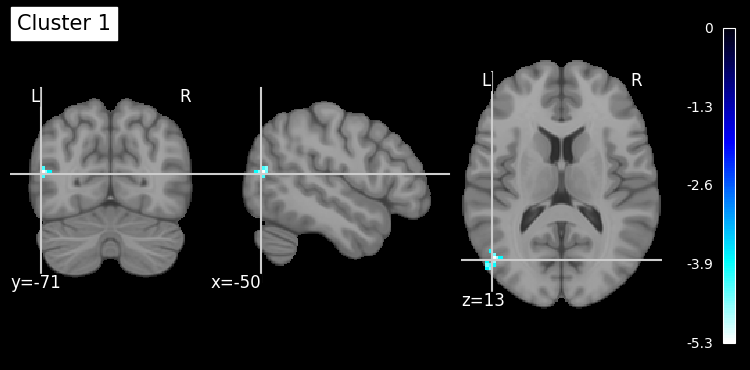

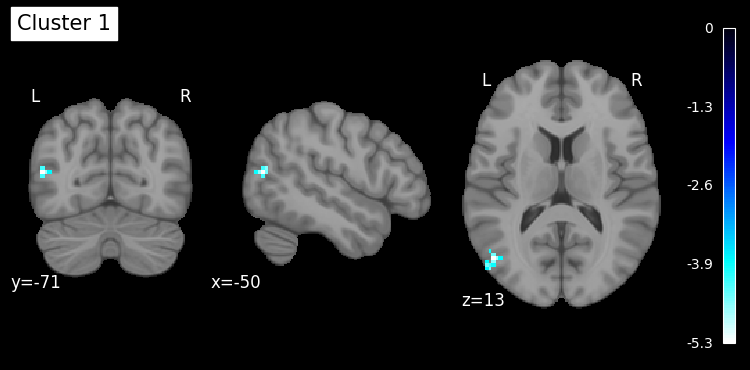

Cluster 2: Voxel value range: -8.034907926831382 to -3.930892076893099

Most significant voxel in cluster 2: [-47. -11.  55.]


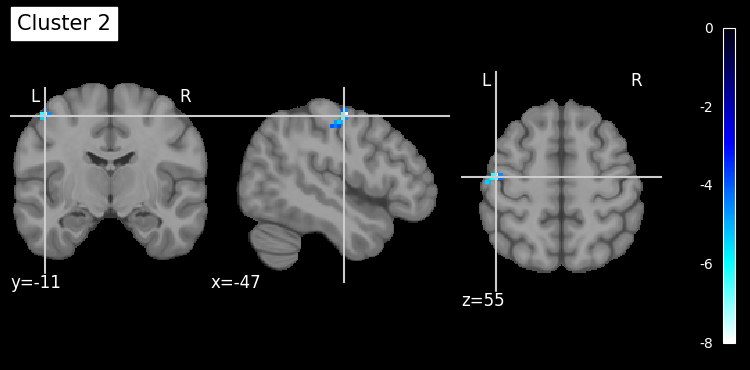

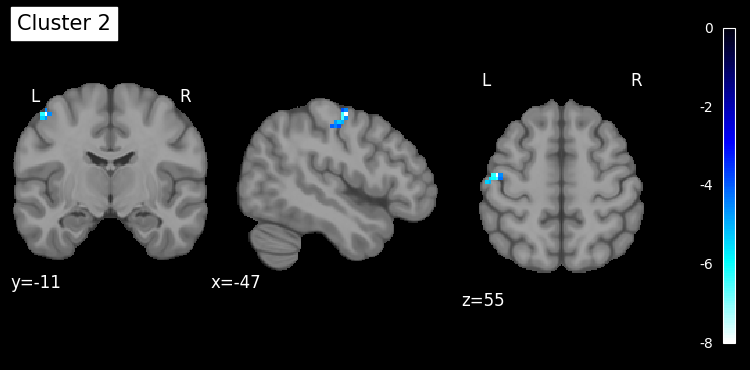

Cluster 3: Voxel value range: 3.845620713762268 to 9.346209492542966

Most significant voxel in cluster 3: [-35.  24. -11.]


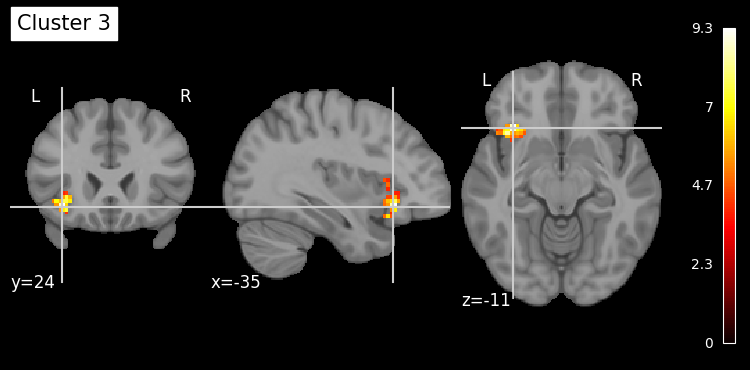

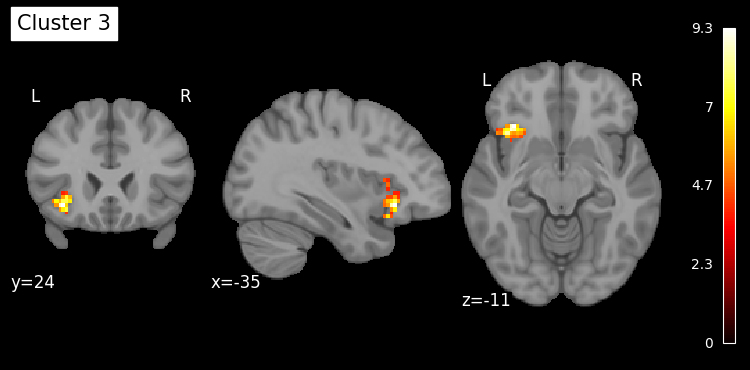

Cluster 4: Voxel value range: -5.906553549308494 to -3.8654749942042668

Most significant voxel in cluster 4: [-45. -78. -14.]


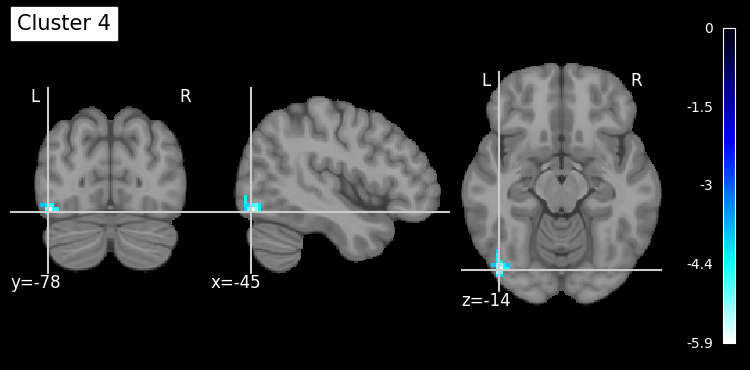

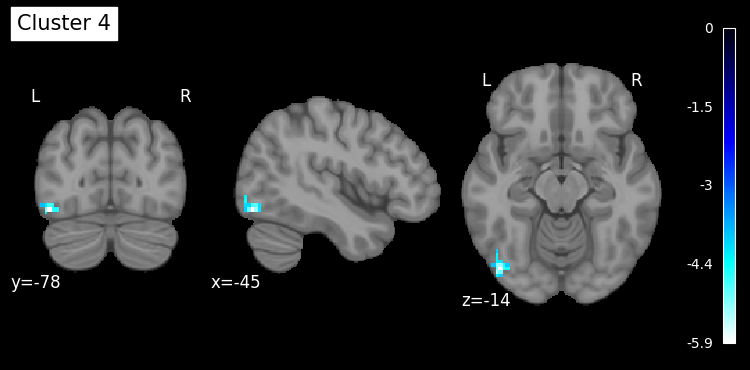

Cluster 5: Voxel value range: 3.822443797002398 to 5.758614124306431

Most significant voxel in cluster 5: [-45. -23.  64.]


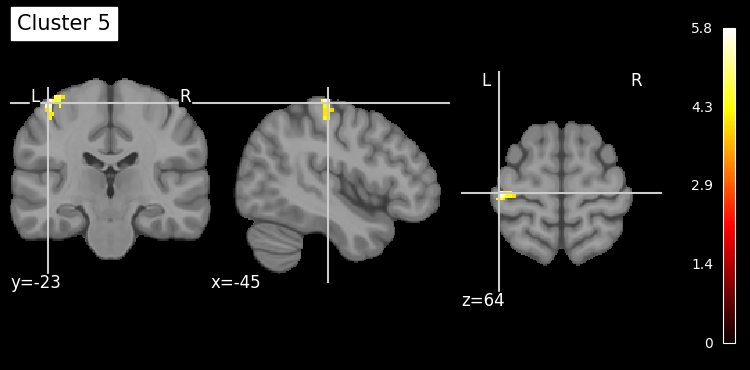

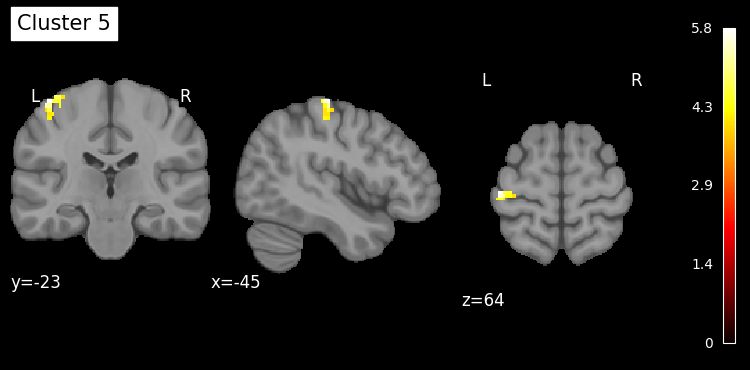

Cluster 6: Voxel value range: 3.8347724231568985 to 5.13632393024572

Most significant voxel in cluster 6: [-15.   7.  67.]


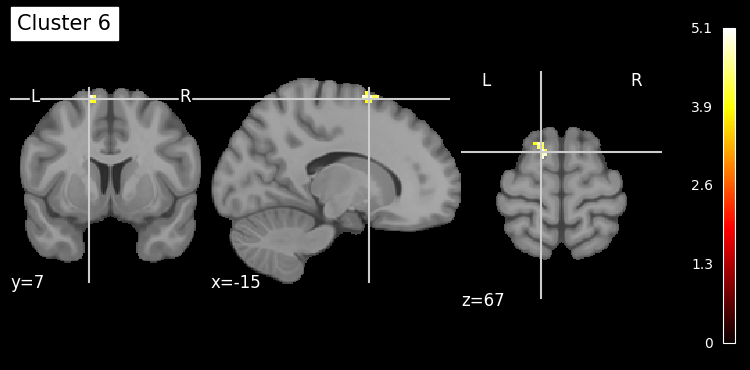

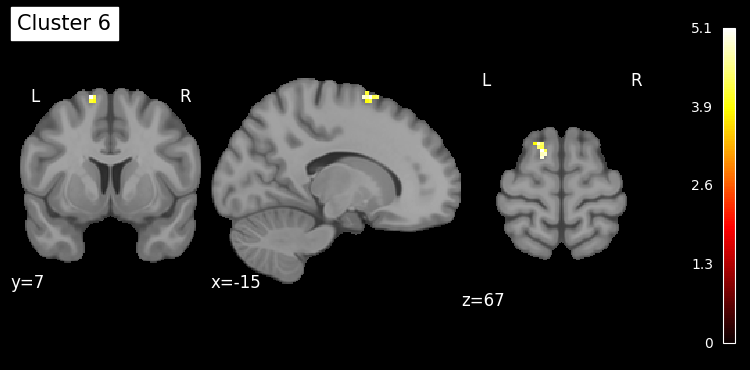

Cluster 7: Voxel value range: 3.85151866305776 to 6.672786960362818

Most significant voxel in cluster 7: [-10. -76.  40.]


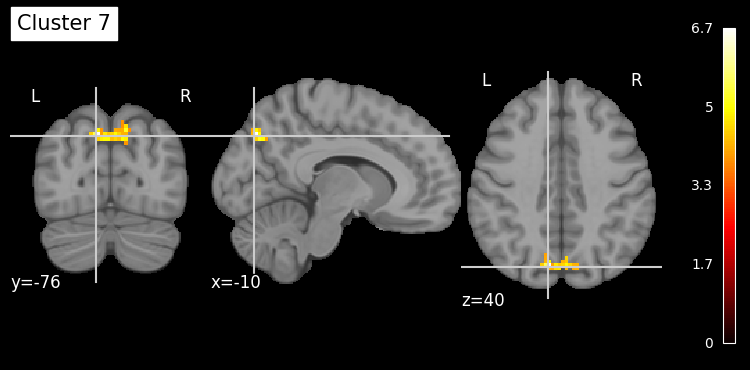

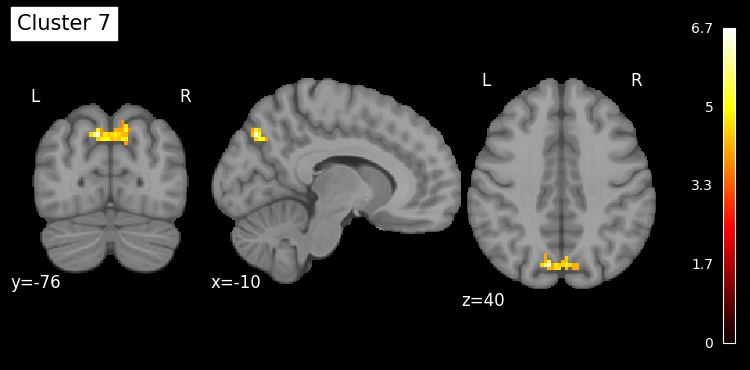

Cluster 8: Voxel value range: 3.8221266429002068 to 7.3502728206901065

Most significant voxel in cluster 8: [-5. 29. 34.]


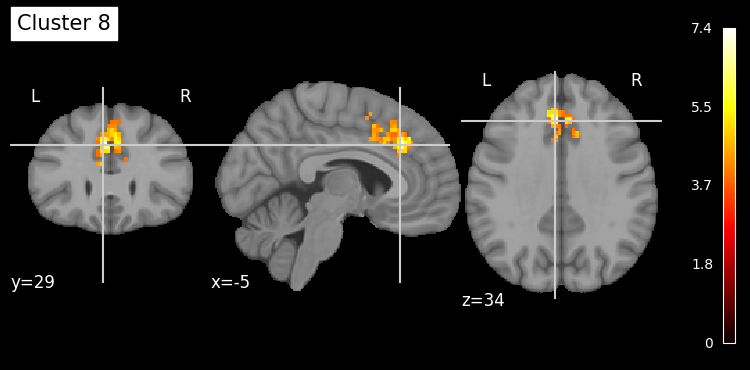

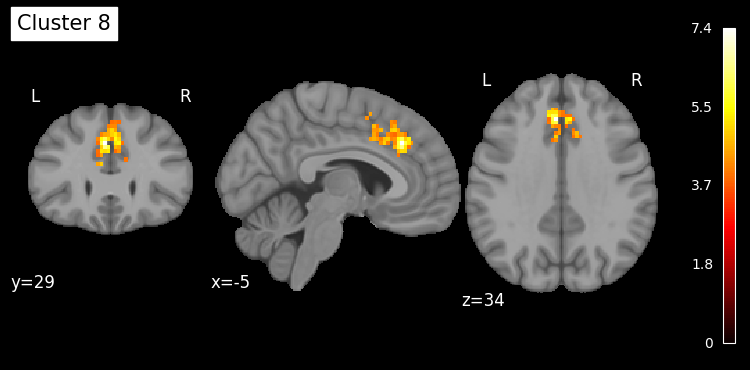

Cluster 9: Voxel value range: 3.8518207079624007 to 7.542876350092362

Most significant voxel in cluster 9: [ 28.  19. -16.]


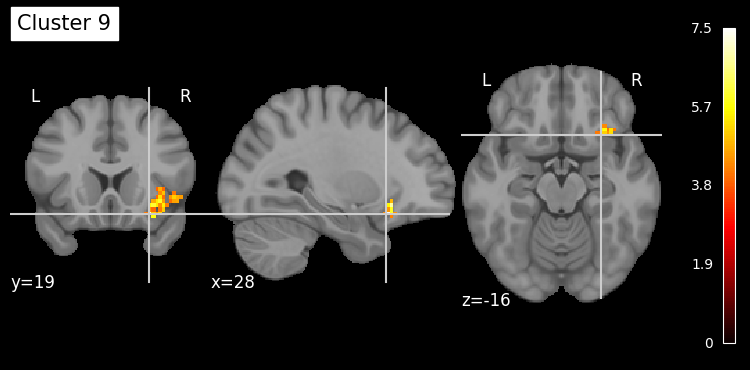

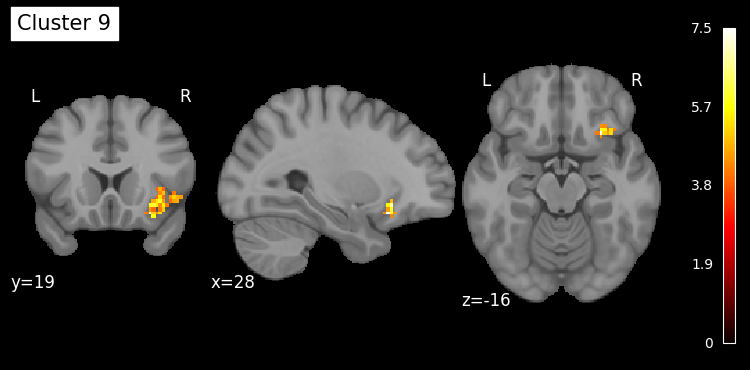

Cluster 10: Voxel value range: -6.230717274773589 to -3.8263186221955077

Most significant voxel in cluster 10: [ 45. -81. -14.]


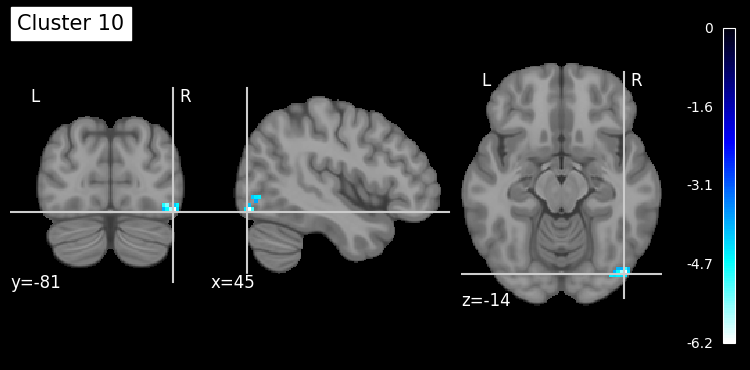

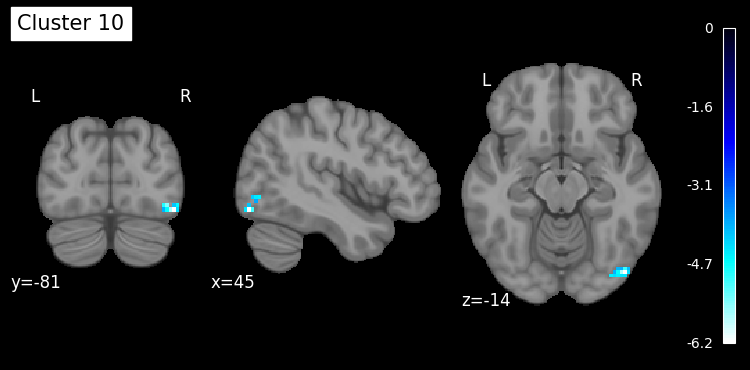

Cluster 11: Voxel value range: -5.8059092430411825 to -3.8913411628362504

Most significant voxel in cluster 11: [50. -8. 52.]


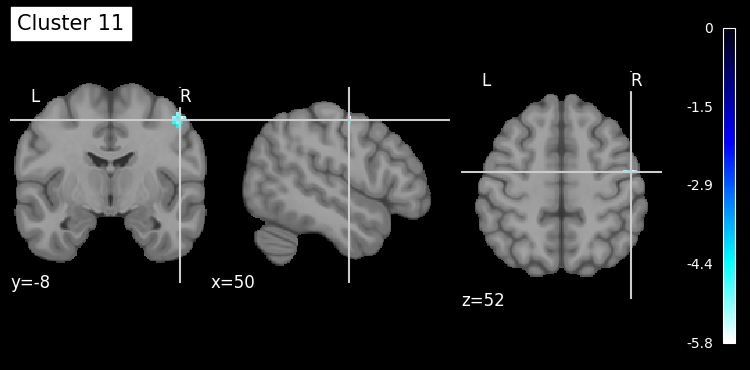

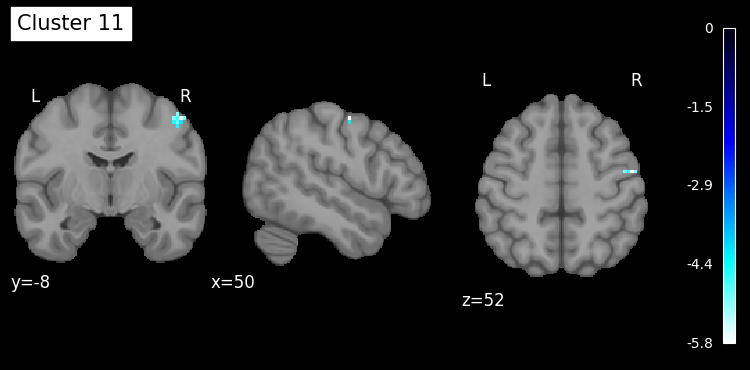

Cluster 12: Voxel value range: 3.828549706088559 to 5.549263670333897

Most significant voxel in cluster 12: [ 43. -58.  43.]


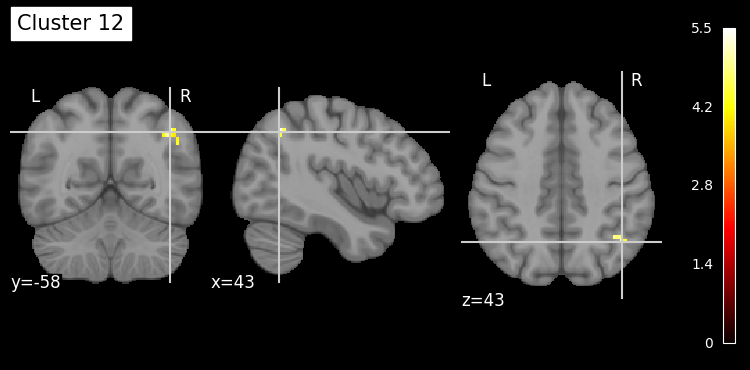

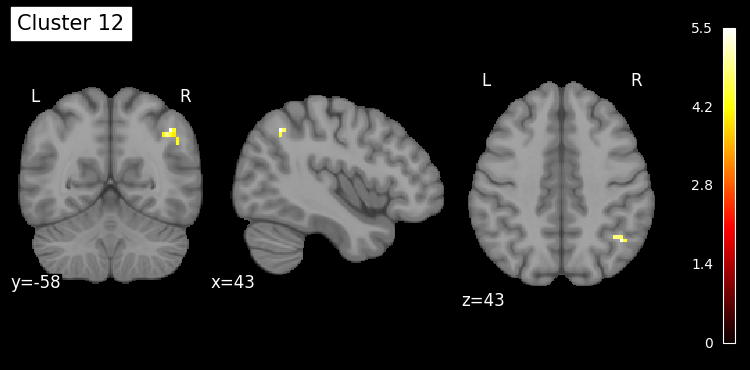

Cluster 13: Voxel value range: -6.138968896422392 to -3.89064894645483

Most significant voxel in cluster 13: [ 53. -71.  16.]


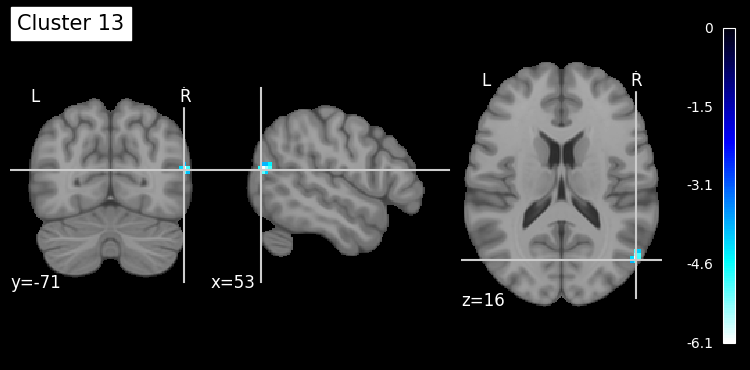

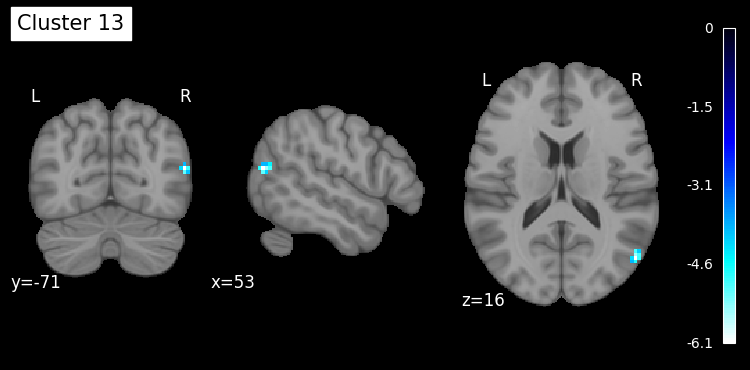

In [10]:
from scipy.ndimage import label, generate_binary_structure

import numpy as np


# Coordinates based on most strongly acitvated voxel in each cluster

# Load the necessary data
contrast_path = '../first_level_GLM/'
cluster_label = 'labeled-judge-videos_two---one'
mask_of_interest = group_clusters[cluster_label][0]['logp_max_size']
bin_mask = np.where(mask_of_interest.get_fdata() > 1.3, 1, 0)

# Label connected components
s = generate_binary_structure(3,3)
labeled_mask, num_features = scipy.ndimage.label(bin_mask, structure=s)
print(f'Number of connected voxel clusters: {num_features}')
print()

# Load the MNI152 template
mni152_template = datasets.load_mni152_template()

# Resample the labeled mask to the MNI152 template space
labeled_mask_img = nib.Nifti1Image(labeled_mask, affine=mask_of_interest.affine)
resampled_labeled_mask_img = image.resample_to_img(labeled_mask_img, mni152_template, interpolation='nearest')
resampled_labeled_mask = resampled_labeled_mask_img.get_fdata()

# Load the contrast data and resample it to the MNI152 template space
orig = group_contrasts[cluster_label][1]['stat']
resampled_orig_img = image.resample_to_img(orig, mni152_template, interpolation='nearest')
data_array = resampled_orig_img.get_fdata()

# Use the resampled MNI152 template directly
mni152_data = mni152_template.get_fdata()
affine = mni152_template.affine

# Apply hemisphere masks to split clusters (commented out)
# cluster_indices = np.arange(1, num_features + 1)

most_significant_voxel_coords = []

for cluster_idx in np.arange(1, num_features + 1):
  cluster_mask = (resampled_labeled_mask == cluster_idx)
  cluster_data = data_array * cluster_mask

  # Find the range of voxel values
  min_val = np.min(cluster_data[cluster_data != 0])
  max_val = np.max(cluster_data[cluster_data != 0])

  # Print the range
  print(f"Cluster {cluster_idx}: Voxel value range: {min_val} to {max_val}")

  # Find the coordinates of the most significant voxel
  max_val = np.max(np.abs(cluster_data))
  most_significant_voxel = np.argwhere(np.abs(cluster_data) == max_val)[0]
  mni_coord = nib.affines.apply_affine(affine, most_significant_voxel)
  most_significant_voxel_coords.append((cluster_idx, mni_coord))
  print()
  print(f'Most significant voxel in cluster {cluster_idx}: {mni_coord}')

  # Plot the cluster
  cluster_img = nib.Nifti1Image(cluster_data, affine)
  fig = plotting.plot_stat_map(cluster_img, bg_img=mni152_template, title=f'Cluster {cluster_idx}', 
                               display_mode='ortho', colorbar=True, cut_coords=mni_coord)
  #fig = plotting.view_img_on_surf(cluster_img)
  plt.show()

  fig = plotting.plot_stat_map(cluster_img, bg_img=mni152_template, title=f'Cluster {cluster_idx}', 
                               display_mode='ortho', colorbar=True, cut_coords=mni_coord, draw_cross=False)
  #fig = plotting.view_img_on_surf(cluster_img)
  plt.show()


# Explore cluster details: Judged Fake versus Judged Real

Get general cluster info

In [11]:
# Coordinates based on most strongly acitvated voxel in each cluster

# Load the necessary data (same as before)

# Label connected component
s = generate_binary_structure(3, 3)
labeled_mask, num_features = scipy.ndimage.label(bin_mask, structure=s)

# Define an empty list to store cluster attributes
cluster_dat = []

# Loop through each cluster
for cluster_idx in np.arange(1, num_features + 1):
    cluster_mask = (resampled_labeled_mask == cluster_idx)
    cluster_data = data_array * cluster_mask

    # Find the range of voxel values
    min_val = np.min(cluster_data[cluster_data != 0])
    max_val = np.max(cluster_data[cluster_data != 0])

    # Find the coordinates of the most significant voxel
    max_val_2 = np.max(np.abs(cluster_data))
    most_significant_voxel = np.argwhere(np.abs(cluster_data) == max_val_2)[0]
    mni_coord = nib.affines.apply_affine(affine, most_significant_voxel)

    # Create a dictionary for each cluster's attributes
    cluster_info = {
        "Cluster ID": cluster_idx,
        "Minimum Voxel (t-value)": f"{min_val}",
        "Maximum Voxel (t-value)": f"{max_val}",
        "Strongest Voxel Coordinates": mni_coord,
        # "Strongest Voxel Other Coordinates": most_significant_voxel,
    }

    # Append the dictionary to the cluster_data list
    cluster_dat.append(cluster_info)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(cluster_dat)

Also obtain the size of each cluster

In [12]:
# Coordinates based on most significant voxel in cluster

# Load the necessary data
contrast_path = '../first_level_GLM/'
cluster_label = 'labeled-judge-videos_two---one'
mask_of_interest = group_clusters[cluster_label][0]['logp_max_size']
bin_mask = np.where(mask_of_interest.get_fdata() > 1.3, 1, 0)

# Label connected components
s = generate_binary_structure(3,3)
labeled_mask, num_features = scipy.ndimage.label(bin_mask, structure=s)
print(f'Number of connected voxel clusters: {num_features}')

# Load the MNI152 template
mni152_template = datasets.load_mni152_template()

# Use the original mask data
data_array = mask_of_interest.get_fdata()
affine = mask_of_interest.affine

# Determine midline in the original space
midline = data_array.shape[0] // 2

# Create binary masks for the left and right hemispheres
left_hemisphere_mask = np.zeros_like(data_array, dtype=bool)
right_hemisphere_mask = np.zeros_like(data_array, dtype=bool)

left_hemisphere_mask[:midline, :, :] = True
right_hemisphere_mask[midline:, :, :] = True

left_hemisphere_img = nib.Nifti1Image(left_hemisphere_mask.astype(np.int32), affine)
right_hemisphere_img = nib.Nifti1Image(right_hemisphere_mask.astype(np.int32), affine)

# Apply hemisphere masks to split clusters
cluster_indices = np.arange(1, num_features + 1)
cluster_sizes = []  # Store the sizes of the clusters

for cluster_idx in cluster_indices:
    cluster_mask = (labeled_mask == cluster_idx)
    
    left_cluster_mask = cluster_mask * left_hemisphere_mask
    right_cluster_mask = cluster_mask * right_hemisphere_mask
    
    left_cluster_size = np.sum(left_cluster_mask)
    right_cluster_size = np.sum(right_cluster_mask)
    
    if left_cluster_size > 0 and right_cluster_size > 0:
        cluster_sizes.append((cluster_idx, 'both', left_cluster_size + right_cluster_size))
        cluster_sizes.append((cluster_idx, 'right', right_cluster_size))
        cluster_sizes.append((cluster_idx, 'left', left_cluster_size))
        
    elif left_cluster_size > 0:
        cluster_sizes.append((cluster_idx, 'left', left_cluster_size))
    elif right_cluster_size > 0:
        cluster_sizes.append((cluster_idx, 'right', right_cluster_size))

# Print the sizes of the clusters
for cluster_idx, hemisphere, size in cluster_sizes:
    print(f'Cluster {cluster_idx} ({hemisphere} hemisphere) size: {size} voxels')


Number of connected voxel clusters: 13
Cluster 1 (left hemisphere) size: 22 voxels
Cluster 2 (left hemisphere) size: 38 voxels
Cluster 3 (left hemisphere) size: 147 voxels
Cluster 4 (left hemisphere) size: 43 voxels
Cluster 5 (left hemisphere) size: 51 voxels
Cluster 6 (left hemisphere) size: 20 voxels
Cluster 7 (both hemisphere) size: 105 voxels
Cluster 7 (right hemisphere) size: 52 voxels
Cluster 7 (left hemisphere) size: 53 voxels
Cluster 8 (both hemisphere) size: 379 voxels
Cluster 8 (right hemisphere) size: 172 voxels
Cluster 8 (left hemisphere) size: 207 voxels
Cluster 9 (right hemisphere) size: 148 voxels
Cluster 10 (right hemisphere) size: 48 voxels
Cluster 11 (right hemisphere) size: 23 voxels
Cluster 12 (right hemisphere) size: 23 voxels
Cluster 13 (right hemisphere) size: 17 voxels


Append cluster sizes to dataframe and clean up (fill in 0 values, sort rows by cluster size)

In [13]:
df['Right Hemisphere Voxels'] = np.nan
df['Left Hemisphere Voxels' ] = np.nan
df['Total Cluster Size' ]     = np.nan

for cs in cluster_sizes:
    
    if cs[1]   == 'both':
        df.loc[df['Cluster ID']==cs[0],'Total Cluster Size']=cs[2]
    elif cs[1] == 'right':
        df.loc[df['Cluster ID']==cs[0],'Right Hemisphere Voxels']=cs[2]
    elif cs[1] == 'left':
        df.loc[df['Cluster ID']==cs[0],'Left Hemisphere Voxels']=cs[2]

In [14]:
df_filled = df.fillna(0)

In [15]:
df_filled.loc[(df_filled['Right Hemisphere Voxels']==0), 'Total Cluster Size']=df_filled['Left Hemisphere Voxels' ]
df_filled.loc[(df_filled['Left Hemisphere Voxels']==0 ), 'Total Cluster Size']=df_filled['Right Hemisphere Voxels']

In [16]:
df_sorted = df_filled.sort_values(by='Total Cluster Size',ascending=False)
df_sorted.to_csv('Fake_v_Real_table_2.csv') #.head(n=5)

df_sorted

,Cluster ID,Minimum Voxel (t-value),Maximum Voxel (t-value),Strongest Voxel Coordinates,Right Hemisphere Voxels,Left Hemisphere Voxels,Total Cluster Size
7,8,3.8221266429002068,7.3502728206901065,"[-5.0, 29.0, 34.0]",172.0,207.0,379.0
8,9,3.8518207079624007,7.542876350092362,"[28.0, 19.0, -16.0]",148.0,0.0,148.0
2,3,3.845620713762268,9.346209492542966,"[-35.0, 24.0, -11.0]",0.0,147.0,147.0
6,7,3.85151866305776,6.672786960362818,"[-10.0, -76.0, 40.0]",52.0,53.0,105.0
4,5,3.822443797002398,5.758614124306431,"[-45.0, -23.0, 64.0]",0.0,51.0,51.0
9,10,-6.230717274773589,-3.8263186221955077,"[45.0, -81.0, -14.0]",48.0,0.0,48.0
3,4,-5.906553549308494,-3.8654749942042668,"[-45.0, -78.0, -14.0]",0.0,43.0,43.0
1,2,-8.034907926831382,-3.930892076893099,"[-47.0, -11.0, 55.0]",0.0,38.0,38.0
11,12,3.828549706088559,5.549263670333897,"[43.0, -58.0, 43.0]",23.0,0.0,23.0
10,11,-5.8059092430411825,-3.8913411628362504,"[50.0, -8.0, 52.0]",23.0,0.0,23.0


Now, find the region of the most activated voxel for each cluster (either the most active voxel or closest to most active voxel)

We look these up by manually entering the MNI coordinates into this online tool 

Atlas template: Human - BNA (Brainnetome atlas based on connectivity profiles)

- https://scalablebrainatlas.incf.org/services/coord2region.php
        

# Explore Cluster Details: Scrambled versus Real

Number of connected voxel clusters: 2

Cluster 1: Voxel value range: 3.8357162333665946 to 5.37635471386554

Most significant voxel in cluster 1: [-22. -88.  16.]


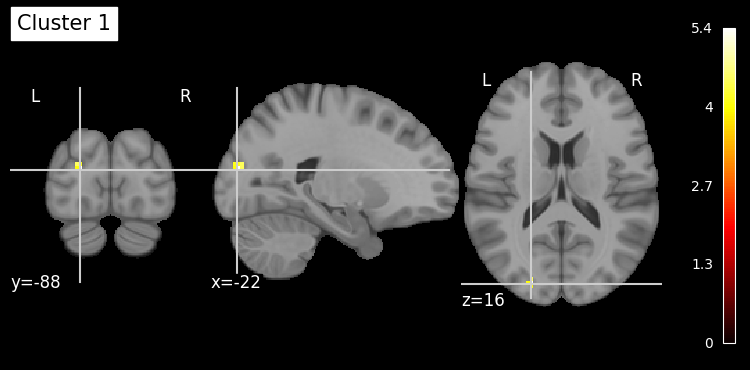

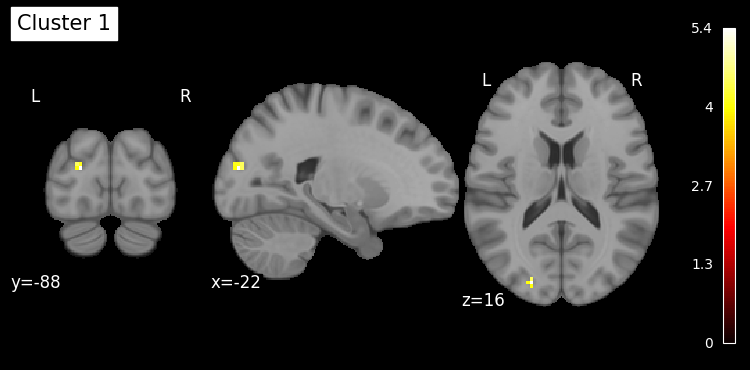

Cluster 2: Voxel value range: 3.8508055648166857 to 5.579803299077689

Most significant voxel in cluster 2: [  3. -46.  58.]


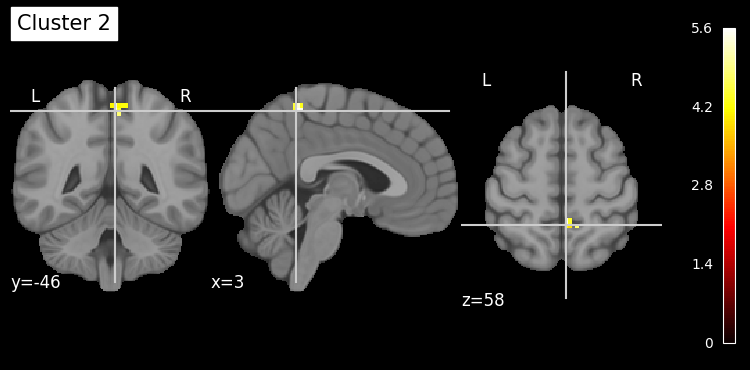

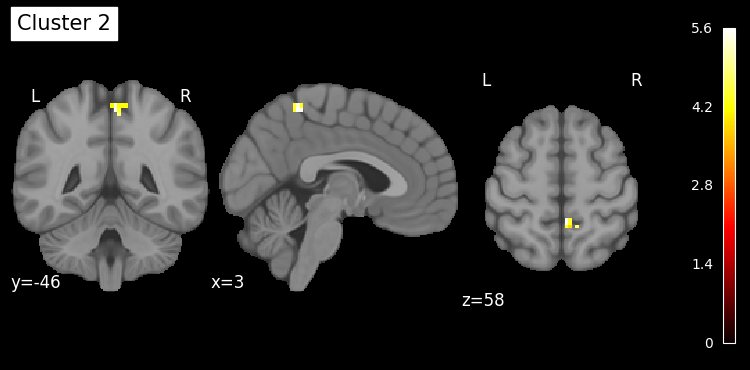

In [17]:
from scipy.ndimage import label, generate_binary_structure

import numpy as np


# Coordinates based on most strongly acitvated voxel in each cluster

# Load the necessary data
contrast_path = '../first_level_GLM/'
cluster_label = 'labeled-type-videos_veridical---scrambled'
mask_of_interest = group_clusters[cluster_label][0]['logp_max_size']
bin_mask = np.where(mask_of_interest.get_fdata() > 1.3, 1, 0)

# Label connected components
s = generate_binary_structure(3,3)
labeled_mask, num_features = scipy.ndimage.label(bin_mask, structure=s)
print(f'Number of connected voxel clusters: {num_features}')
print()

# Load the MNI152 template
mni152_template = datasets.load_mni152_template()

# Resample the labeled mask to the MNI152 template space
labeled_mask_img = nib.Nifti1Image(labeled_mask, affine=mask_of_interest.affine)
resampled_labeled_mask_img = image.resample_to_img(labeled_mask_img, mni152_template, interpolation='nearest')
resampled_labeled_mask = resampled_labeled_mask_img.get_fdata()

# Load the contrast data and resample it to the MNI152 template space
orig = group_contrasts[cluster_label][1]['stat']
resampled_orig_img = image.resample_to_img(orig, mni152_template, interpolation='nearest')
data_array = resampled_orig_img.get_fdata()

# Use the resampled MNI152 template directly
mni152_data = mni152_template.get_fdata()
affine = mni152_template.affine

# Apply hemisphere masks to split clusters (commented out)
# cluster_indices = np.arange(1, num_features + 1)

most_significant_voxel_coords = []

for cluster_idx in np.arange(1, num_features + 1):
  cluster_mask = (resampled_labeled_mask == cluster_idx)
  cluster_data = data_array * cluster_mask

  # Find the range of voxel values
  min_val = np.min(cluster_data[cluster_data != 0])
  max_val = np.max(cluster_data[cluster_data != 0])

  # Print the range
  print(f"Cluster {cluster_idx}: Voxel value range: {min_val} to {max_val}")

  # Find the coordinates of the most significant voxel
  max_val = np.max(np.abs(cluster_data))
  most_significant_voxel = np.argwhere(np.abs(cluster_data) == max_val)[0]
  mni_coord = nib.affines.apply_affine(affine, most_significant_voxel)
  most_significant_voxel_coords.append((cluster_idx, mni_coord))
  print()
  print(f'Most significant voxel in cluster {cluster_idx}: {mni_coord}')

  # Plot the cluster
  cluster_img = nib.Nifti1Image(cluster_data, affine)
  fig = plotting.plot_stat_map(cluster_img, bg_img=mni152_template, title=f'Cluster {cluster_idx}', 
                               display_mode='ortho', colorbar=True, cut_coords=mni_coord)
  #fig = plotting.view_img_on_surf(cluster_img)
  plt.show()

  fig = plotting.plot_stat_map(cluster_img, bg_img=mni152_template, title=f'Cluster {cluster_idx}', 
                               display_mode='ortho', colorbar=True, cut_coords=mni_coord, draw_cross=False)
  #fig = plotting.view_img_on_surf(cluster_img)
  plt.show()


In [18]:
# Coordinates based on most strongly acitvated voxel in each cluster

# Load the necessary data (same as before)

# Label connected component
s = generate_binary_structure(3, 3)
labeled_mask, num_features = scipy.ndimage.label(bin_mask, structure=s)

# Define an empty list to store cluster attributes
cluster_dat = []

# Loop through each cluster
for cluster_idx in np.arange(1, num_features + 1):
    cluster_mask = (resampled_labeled_mask == cluster_idx)
    cluster_data = data_array * cluster_mask

    # Find the range of voxel values
    min_val = np.min(cluster_data[cluster_data != 0])
    max_val = np.max(cluster_data[cluster_data != 0])

    # Find the coordinates of the most significant voxel
    max_val_2 = np.max(np.abs(cluster_data))
    most_significant_voxel = np.argwhere(np.abs(cluster_data) == max_val_2)[0]
    mni_coord = nib.affines.apply_affine(affine, most_significant_voxel)

    # Create a dictionary for each cluster's attributes
    cluster_info = {
        "Cluster ID": cluster_idx,
        "Minimum Voxel (t-value)": f"{min_val}",
        "Maximum Voxel (t-value)": f"{max_val}",
        "Strongest Voxel Coordinates": mni_coord,
        # "Strongest Voxel Other Coordinates": most_significant_voxel,
    }

    # Append the dictionary to the cluster_data list
    cluster_dat.append(cluster_info)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(cluster_dat)

In [19]:
df['Right Hemisphere Voxels'] = np.nan
df['Left Hemisphere Voxels' ] = np.nan
df['Total Cluster Size' ]     = np.nan

for cs in cluster_sizes:
    
    if cs[1]   == 'both':
        df.loc[df['Cluster ID']==cs[0],'Total Cluster Size']=cs[2]
    elif cs[1] == 'right':
        df.loc[df['Cluster ID']==cs[0],'Right Hemisphere Voxels']=cs[2]
    elif cs[1] == 'left':
        df.loc[df['Cluster ID']==cs[0],'Left Hemisphere Voxels']=cs[2]

In [20]:
df_filled = df.fillna(0)

In [21]:
df_filled.loc[(df_filled['Right Hemisphere Voxels']==0), 'Total Cluster Size']=df_filled['Left Hemisphere Voxels' ]
df_filled.loc[(df_filled['Left Hemisphere Voxels']==0 ), 'Total Cluster Size']=df_filled['Right Hemisphere Voxels']

In [22]:
df_sorted = df_filled.sort_values(by='Total Cluster Size',ascending=False)
df_sorted.to_csv('Fake_v_Real_table.csv') #.head(n=5)

In [23]:
df_sorted.to_csv('Veridical_v_Scrambled.csv')

In [24]:
df_sorted

,Cluster ID,Minimum Voxel (t-value),Maximum Voxel (t-value),Strongest Voxel Coordinates,Right Hemisphere Voxels,Left Hemisphere Voxels,Total Cluster Size
1,2,3.8508055648166857,5.579803299077689,"[3.0, -46.0, 58.0]",0.0,38.0,38.0
0,1,3.8357162333665946,5.37635471386554,"[-22.0, -88.0, 16.0]",0.0,22.0,22.0
